In [1]:
# mainly follow official scVelo tutorial
#     https://smorabit.github.io/tutorials/8_velocyto/
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import os
import pandas as pd

In [2]:
# R output folder
Rout = "I:/Shared_win/projects/20220623_10x_ZKW/analysis_plus/scVelo_prep/"

In [3]:
# load sparse matrix, which is from R GEX.seur[['RNA']]@counts
X = io.mmread(Rout + "counts.mtx")

In [4]:
# create anndata object, which in python is like a seurat obj in R to store scRNAseq datasets
adata = anndata.AnnData(
    X=X.transpose().tocsr()
)

In [5]:
# load cell metadata:
cell_meta = pd.read_csv(Rout + "metadata.csv")

In [6]:
# load gene names:
with open(Rout + "gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

In [7]:
# set anndata observations and index obs by barcodes, var by gene names
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction:
pca = pd.read_csv(Rout + "pca.csv")
pca.index = adata.obs.index

# set pca and umap
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(),
                                adata.obs['UMAP_2'].to_numpy())).T

In [8]:
adata.obs['Anno1']

barcode
AAACCCAGTAACATAG-1    EOS2
AAACCCATCCTCTAAT-1    EOS2
AAACGAAAGTGCGACA-1    EOS1
AAACGAACATGACAAA-1    EOS1
AAACGAACATGGCCCA-1    EOS2
                      ... 
TTTGGTTTCGAGAAAT-1    EOS2
TTTGTTGCACGAGGTA-1    EOS2
TTTGTTGCATTCACAG-1    EOS1
TTTGTTGGTATCAGGG-1    EOS2
TTTGTTGTCCGTCAAA-1    EOS1
Name: Anno1, Length: 3205, dtype: object

In [9]:
# set cluster orders, similar to factor levels of metadata in seurat object
#adata.obs['Anno1'].cat.reorder_categories(["EOS1","EOS2","EOS3"],inplace=True)


In [10]:
# set scanpy default figure parameters        
sc.set_figure_params(dpi=160, dpi_save=180, frameon=True, vector_friendly=True, fontsize=8)

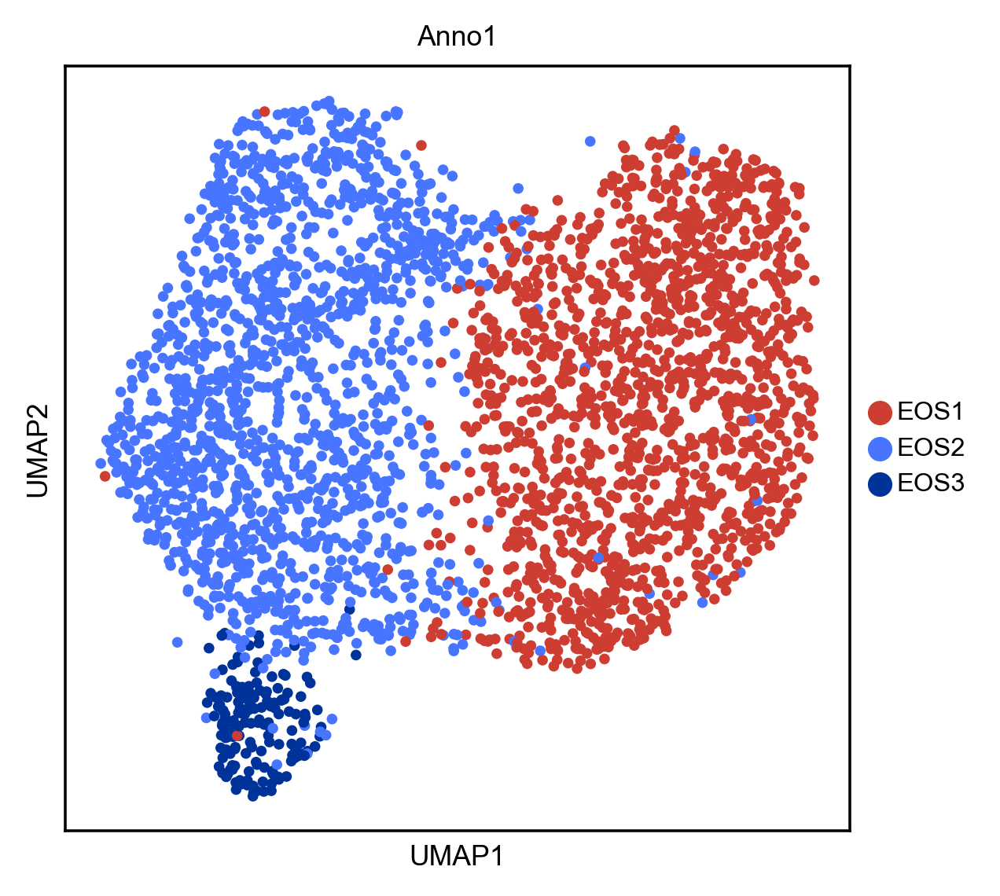

In [12]:
# plot a UMAP colored as in R Seurat
sc.pl.umap(adata, color=['Anno1'], frameon=True, save='EOS.umap_Anno1.png',
          palette=["#CE3D32FF","#4775FFFF","#003399FF"], sort_order=False)

# main scVelo steps 

In [13]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad

In [14]:
# set some default values
scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi = 150, frameon=False)
cr.settings.verbosity =2

In [15]:
ldata = scv.read(Rout + "../../velocyto_out/EOS_plus.loom", cache=True)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [16]:
ldata.var_names_make_unique()

### first issue, cell barcode names to match

In [17]:
adata

AnnData object with n_obs × n_vars = 3205 × 14783
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'seurat_clusters', 'preAnno1', 'preAnno2', 'DoubletFinder0.05', 'DoubletFinder0.1', 'score.SI_Nup', 'score.SI_Pup', 'Anno1', 'score.SI_Uniq20', 'score.SI_Uniq40', 'score.SI_Uniq100', 'score.SI_Uniq262', 'barcode', 'UMAP_1', 'UMAP_2'
    uns: 'Anno1_colors'
    obsm: 'X_pca', 'X_umap'

In [18]:
adata.obs.index[0:7]

Index(['AAACCCAGTAACATAG-1', 'AAACCCATCCTCTAAT-1', 'AAACGAAAGTGCGACA-1',
       'AAACGAACATGACAAA-1', 'AAACGAACATGGCCCA-1', 'AAACGAAGTTATTCTC-1',
       'AAACGCTCAATAGTGA-1'],
      dtype='object', name='barcode')

In [19]:
ldata

AnnData object with n_obs × n_vars = 3924 × 56262
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [20]:
ldata.obs.index[0:7]

Index(['EOS_plus:AAATGGACATGTGACTx', 'EOS_plus:AACAACCGTCAAATCCx',
       'EOS_plus:AACCAACTCATTACTCx', 'EOS_plus:AACAACCGTTGGGACAx',
       'EOS_plus:AACGGGATCGTGCTCTx', 'EOS_plus:AAAGGTAGTCGGTACCx',
       'EOS_plus:AACAACCTCACTTCTAx'],
      dtype='object', name='CellID')

In [21]:
# rename barcodes in order to merge
barcodes = [bc.split(':')[1] for bc in ldata.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '-1' for bc in barcodes]
barcodes[0:7]

['AAATGGACATGTGACT-1',
 'AACAACCGTCAAATCC-1',
 'AACCAACTCATTACTC-1',
 'AACAACCGTTGGGACA-1',
 'AACGGGATCGTGCTCT-1',
 'AAAGGTAGTCGGTACC-1',
 'AACAACCTCACTTCTA-1']

In [22]:
# rename barcodes of three ldata
ldata.obs.index = barcodes

In [23]:
ldata

AnnData object with n_obs × n_vars = 3924 × 56262
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [24]:
ldata.obs.index[0:7]

Index(['AAATGGACATGTGACT-1', 'AACAACCGTCAAATCC-1', 'AACCAACTCATTACTC-1',
       'AACAACCGTTGGGACA-1', 'AACGGGATCGTGCTCT-1', 'AAAGGTAGTCGGTACC-1',
       'AACAACCTCACTTCTA-1'],
      dtype='object')

In [25]:
# filter for barcode
# https://github.com/theislab/anndata/issues/648
ldata_sub = ldata[ldata.obs_names.isin(adata.obs.index)]
ldata_sub

View of AnnData object with n_obs × n_vars = 3205 × 56262
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [26]:
import gc
gc.collect()

5350

In [27]:
adata_all = scv.utils.merge(adata, ldata_sub)
adata_all

AnnData object with n_obs × n_vars = 3205 × 14665
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'seurat_clusters', 'preAnno1', 'preAnno2', 'DoubletFinder0.05', 'DoubletFinder0.1', 'score.SI_Nup', 'score.SI_Pup', 'Anno1', 'score.SI_Uniq20', 'score.SI_Uniq40', 'score.SI_Uniq100', 'score.SI_Uniq262', 'barcode', 'UMAP_1', 'UMAP_2', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'Anno1_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

saving figure to file ./figures/scvelo_proportions_prop_Anno1.png


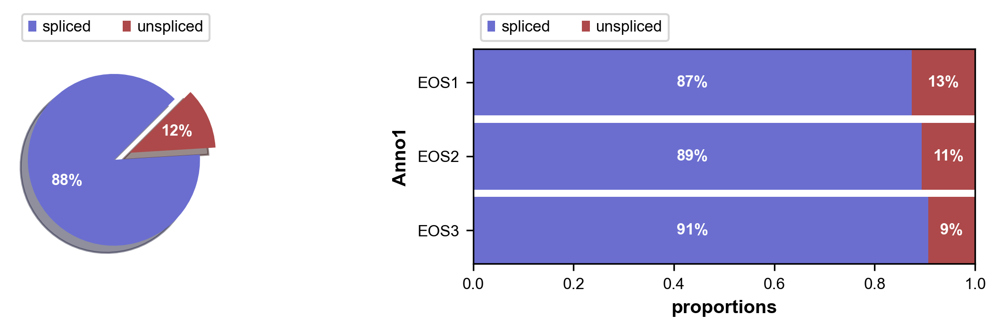

In [28]:
scv.pl.proportions(adata_all, groupby='Anno1', save='prop_Anno1.png', dpi=150)

## all kept

In [29]:
# pre-process
scv.pp.filter_and_normalize(adata_all, min_shared_counts=30, n_top_genes=3000)
scv.pp.moments(adata_all, n_pcs=30, n_neighbors=30)

Filtered out 13391 genes that are detected 30 counts (shared).
Normalized count data: X, spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing neighbors
    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [30]:
adata_all

AnnData object with n_obs × n_vars = 3205 × 1274
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'seurat_clusters', 'preAnno1', 'preAnno2', 'DoubletFinder0.05', 'DoubletFinder0.1', 'score.SI_Nup', 'score.SI_Pup', 'Anno1', 'score.SI_Uniq20', 'score.SI_Uniq40', 'score.SI_Uniq100', 'score.SI_Uniq262', 'barcode', 'UMAP_1', 'UMAP_2', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'Anno1_colors', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

### stochastic model

In [31]:
adata0_stot = adata_all
adata0_stot

AnnData object with n_obs × n_vars = 3205 × 1274
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'seurat_clusters', 'preAnno1', 'preAnno2', 'DoubletFinder0.05', 'DoubletFinder0.1', 'score.SI_Nup', 'score.SI_Pup', 'Anno1', 'score.SI_Uniq20', 'score.SI_Uniq40', 'score.SI_Uniq100', 'score.SI_Uniq262', 'barcode', 'UMAP_1', 'UMAP_2', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'Anno1_colors', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

In [32]:
# compute velocity
scv.tl.velocity(adata0_stot, mode='stochastic')   # model selection ?
scv.tl.velocity_graph(adata0_stot, n_jobs=8)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 8/16 cores)


  0%|          | 0/3205 [00:00<?, ?cells/s]

F:\ProgramData\Anaconda3\lib\site-packages\scvelo\core\_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_Anno1.embedding_grid.png


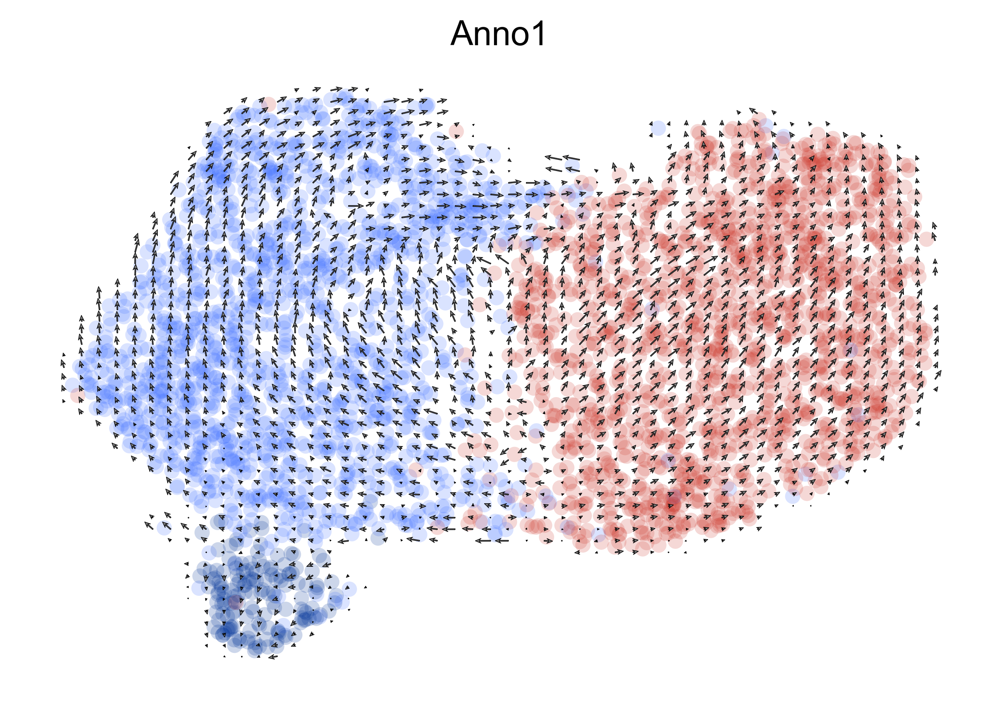

In [33]:
scv.pl.velocity_embedding_grid(adata0_stot, basis='umap',color='Anno1',
                              scale=0.25, dpi = 240, save='Anno1.embedding_grid.png')

saving figure to file ./figures/scvelo_Anno1.embedding_stream.png


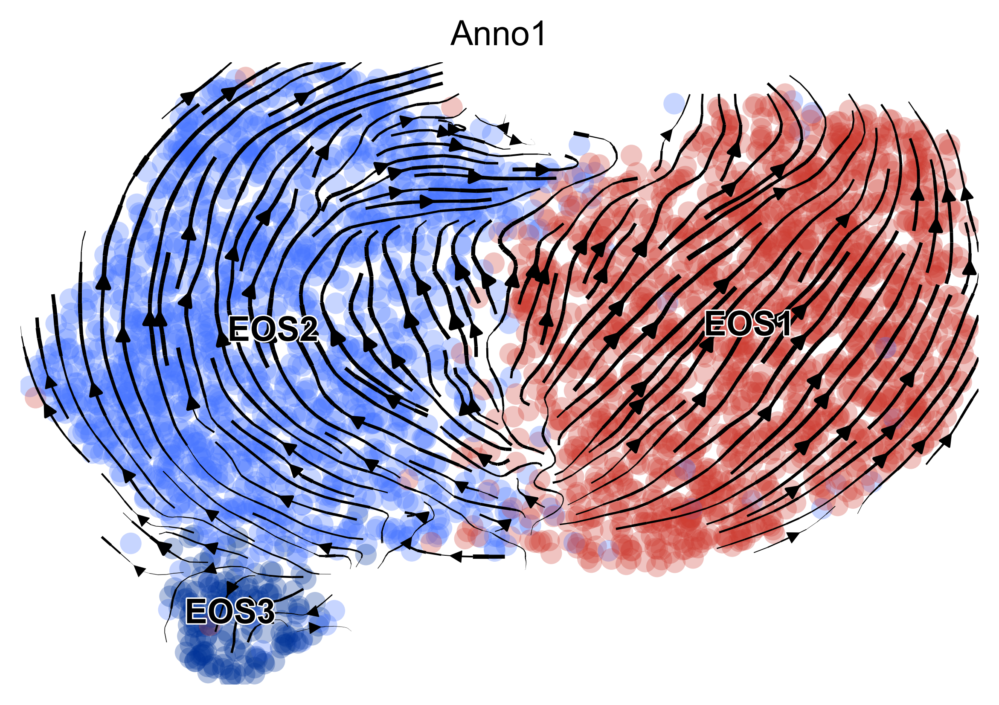

In [34]:
scv.pl.velocity_embedding_stream(adata0_stot, basis='umap',color='Anno1',
                                 dpi = 240, save='Anno1.embedding_stream.png')

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
saving figure to file ./figures/scvelo_Anno1.confidence.png


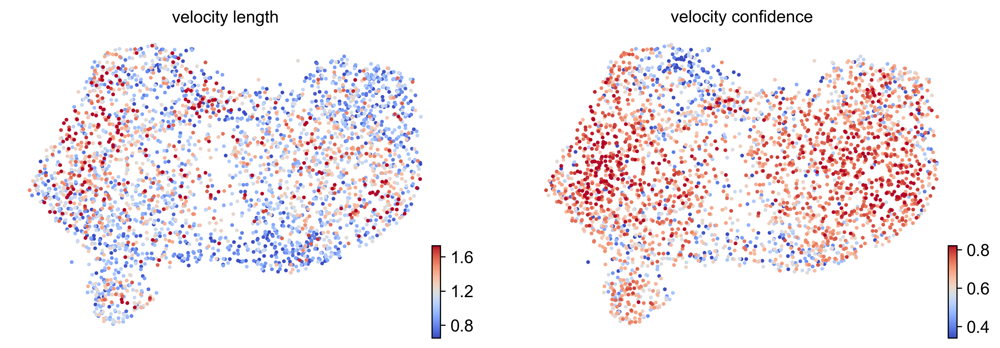

In [35]:
##
scv.tl.velocity_confidence(adata0_stot)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata0_stot, c=keys, cmap='coolwarm', perc=[5,95], save='Anno1.confidence.png')

computing terminal states
    identified 3 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_Anno1.pseudol.png


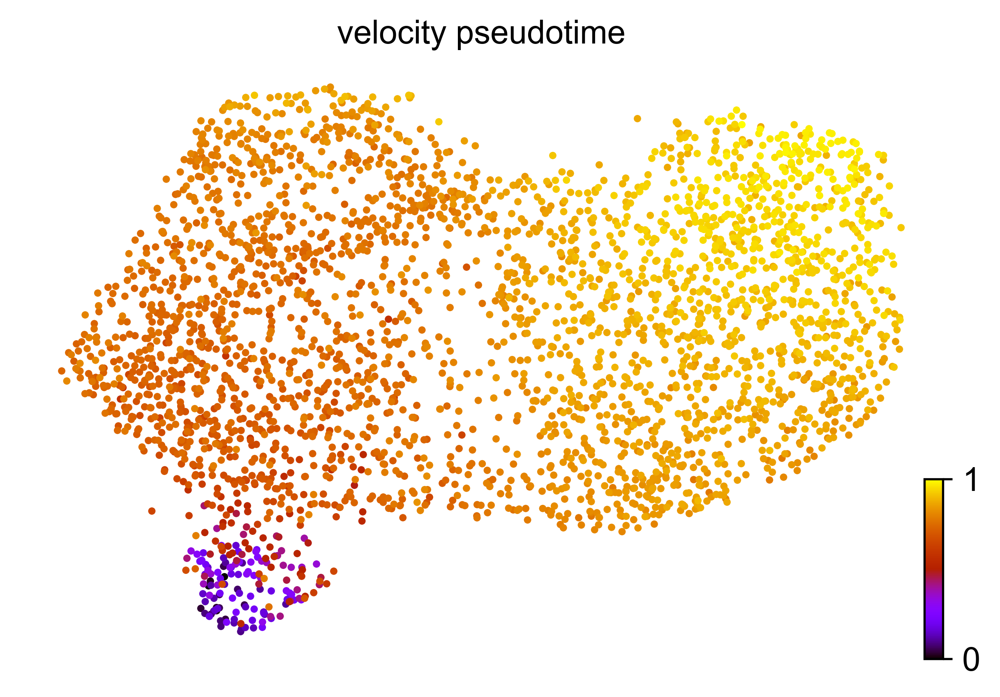

In [36]:
scv.tl.velocity_pseudotime(adata0_stot)
scv.pl.scatter(adata0_stot, color='velocity_pseudotime', cmap='gnuplot',save='Anno1.pseudol.png',dpi=240)

In [37]:
# code needed for a bug which would be fixed soon
adata0_stot.uns['neighbors']['distances'] = adata0_stot.obsp['distances']
adata0_stot.uns['neighbors']['connectivities'] = adata0_stot.obsp['connectivities']

scv.tl.paga(adata0_stot, groups='Anno1')
df0_stot = scv.get_df(adata0_stot, 'paga/transitions_confidence',precision=2).T
df0_stot.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2
0,0,0,0
1,0.77,0,0
2,0,0.6,0


saving figure to file ./figures/scvelo_Anno1.paga.png


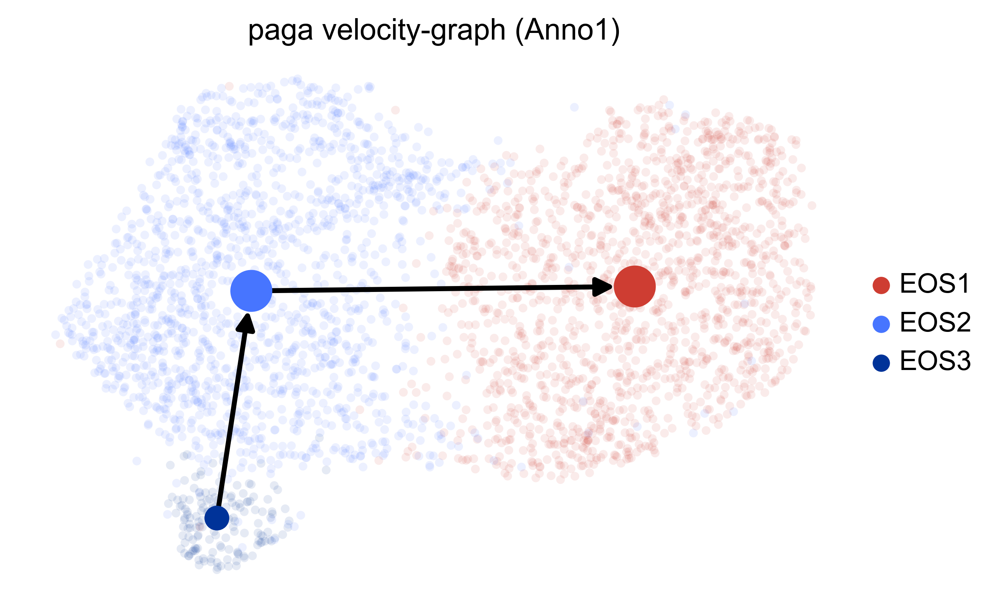

In [38]:
scv.pl.paga(adata0_stot, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, dpi=240, save='Anno1.paga.png')

seems somehow reasonable, Ccl9+ circulating-like EOS3  to=>  Nmur1- EOS2  to=>  Nmur1+ EOS3,    
and the spliced-unspliced ratio supports,  
but local stream looks like a little strange that does not totally fits the final prediction            

### dynamic model

In [39]:
adata0_dynm = adata_all
adata0_dynm

AnnData object with n_obs × n_vars = 3205 × 1274
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'seurat_clusters', 'preAnno1', 'preAnno2', 'DoubletFinder0.05', 'DoubletFinder0.1', 'score.SI_Nup', 'score.SI_Pup', 'Anno1', 'score.SI_Uniq20', 'score.SI_Uniq40', 'score.SI_Uniq100', 'score.SI_Uniq262', 'barcode', 'UMAP_1', 'UMAP_2', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'Anno1_colors', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'paga', 'Anno1_sizes'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms

In [40]:
scv.tl.recover_dynamics(adata0_dynm, n_jobs=8)

recovering dynamics (using 8/16 cores)


  0%|          | 0/47 [00:00<?, ?gene/s]

    finished (0:00:06) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


F:\ProgramData\Anaconda3\lib\site-packages\scvelo\tools\dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
F:\ProgramData\Anaconda3\lib\site-packages\scvelo\tools\dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [41]:
scv.tl.velocity(adata0_dynm, mode='dynamical')
scv.tl.velocity_graph(adata0_dynm, n_jobs=8)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 8/16 cores)


  0%|          | 0/3205 [00:00<?, ?cells/s]

F:\ProgramData\Anaconda3\lib\site-packages\scvelo\core\_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_Anno1.embedding_grid.dynm.png


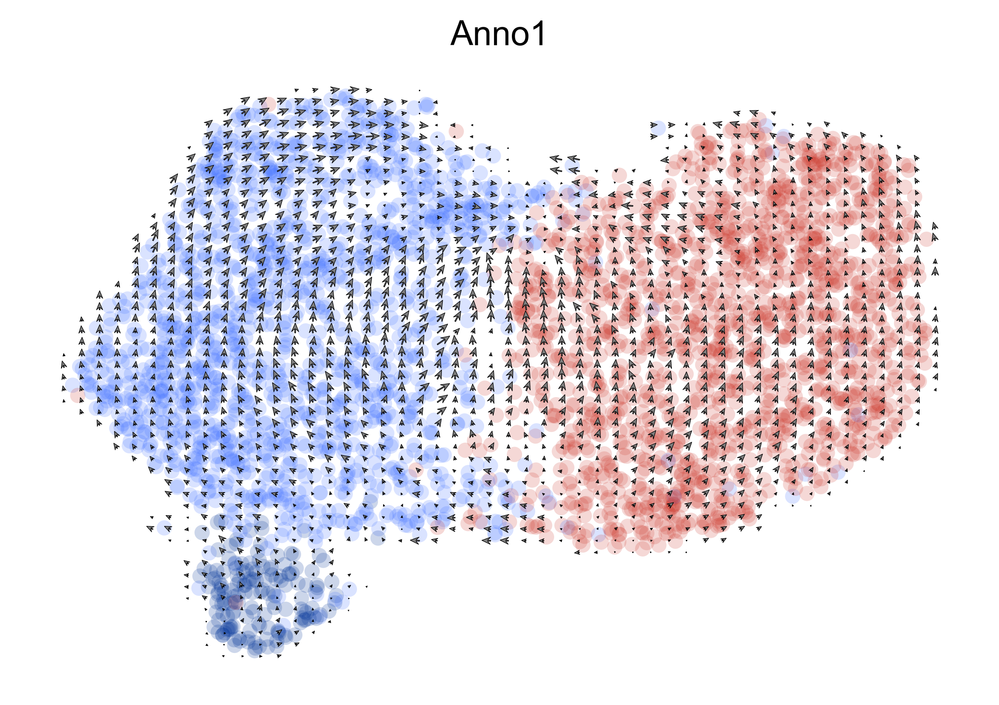

In [42]:
#
scv.pl.velocity_embedding_grid(adata0_dynm, basis='umap',color='Anno1',dpi=240,arrow_length=3.2, arrow_size=1.5,
                                save='Anno1.embedding_grid.dynm.png')

saving figure to file ./figures/scvelo_Anno1.embedding_stream.dynm.png


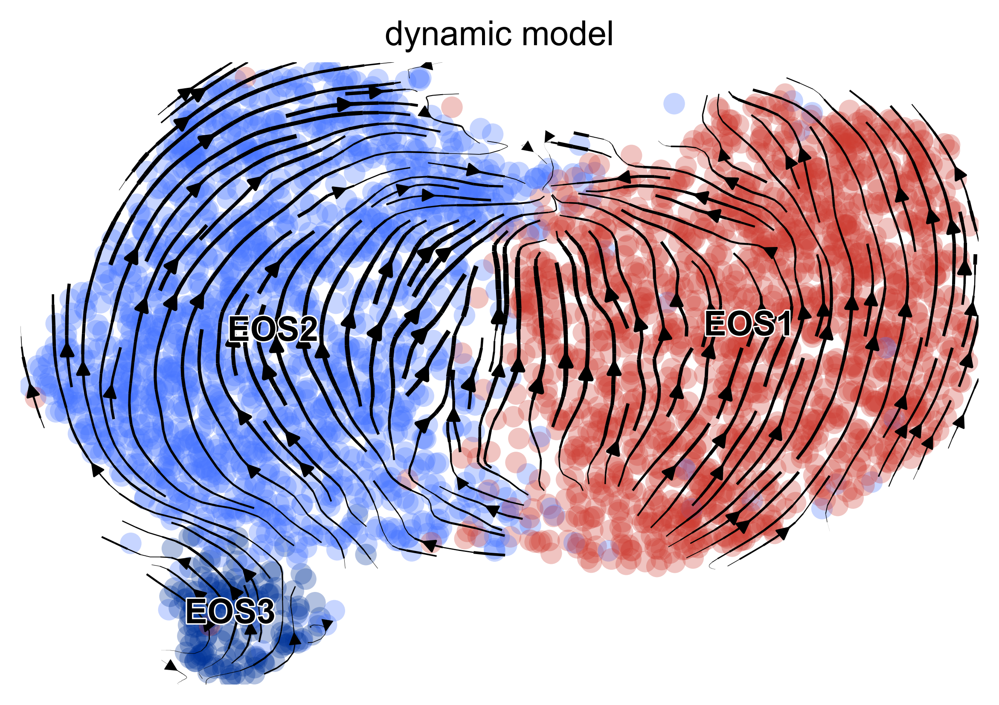

In [43]:
# 
scv.pl.velocity_embedding_stream(adata0_dynm, basis='umap',color='Anno1',dpi=240,
                                save='Anno1.embedding_stream.dynm.png', title= "dynamic model")

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
saving figure to file ./figures/scvelo_Anno1.confidence_dynamic.png


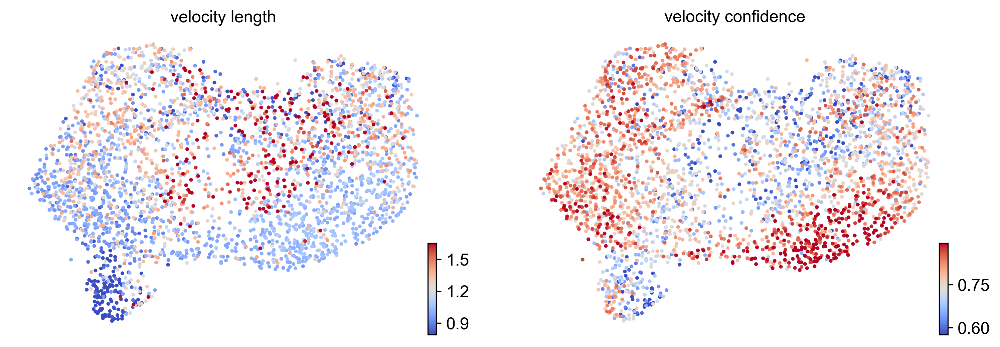

In [44]:
##
scv.tl.velocity_confidence(adata0_dynm)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata0_dynm, c=keys, cmap='coolwarm', perc=[5,95], save='Anno1.confidence_dynamic.png')

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file ./figures/scvelo_Anno1.latent.dynamic.png


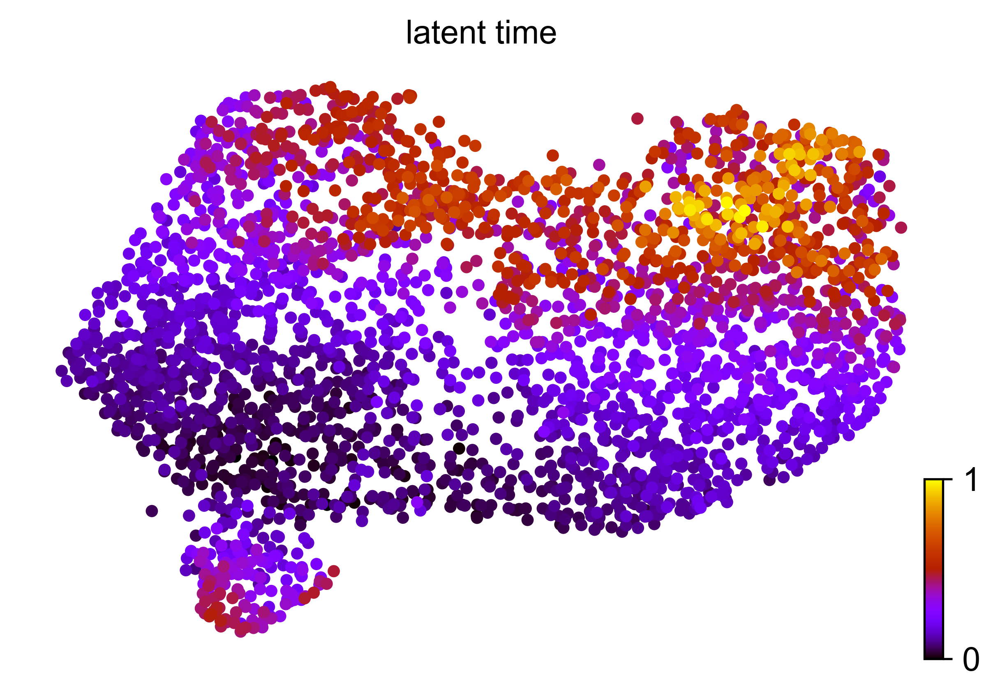

In [45]:
scv.tl.latent_time(adata0_dynm)
scv.pl.scatter(adata0_dynm, color='latent_time',color_map='gnuplot', size=80, dpi=240, save='Anno1.latent.dynamic.png')

In [46]:
# code needed for a bug which would be fixed soon
adata0_dynm.uns['neighbors']['distances'] = adata0_dynm.obsp['distances']
adata0_dynm.uns['neighbors']['connectivities'] = adata0_dynm.obsp['connectivities']

scv.tl.paga(adata0_dynm, groups='Anno1')
df0_dynm = scv.get_df(adata0_dynm, 'paga/transitions_confidence',precision=2).T
df0_dynm.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2
0,0,0,0
1,0.83,0,0
2,0,0.24,0


saving figure to file ./figures/scvelo_Anno1.paga_dynamic.png


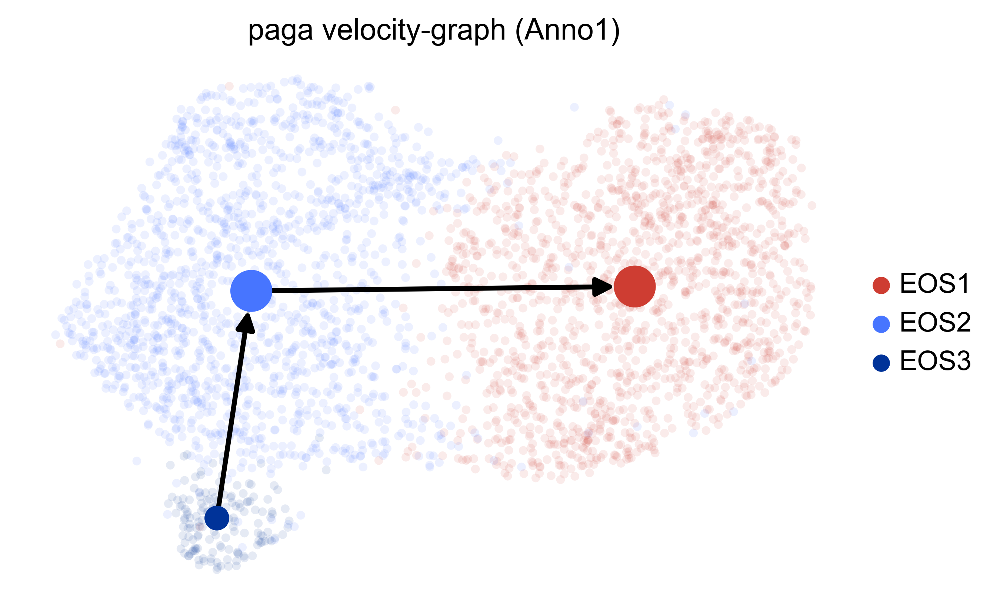

In [47]:
scv.pl.paga(adata0_dynm, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, dpi=240, save='Anno1.paga_dynamic.png')

same final prediction but similar chaotic local stream.              
this analysis is only for a quick test,               
further modification may need more detailed demonstrations on gene level and ranges of cutoffs                        
to test the robustness and differences         